In [3]:
!pip install networkx powerlaw

In [4]:
import networkx as nx
import matplotlib.pyplot as plt
import statistics
import sys
import random
import math
import numpy as np
import powerlaw
import pandas as pd
import seaborn as sns
from itertools import chain, combinations
from scipy.cluster.hierarchy import dendrogram
from collections import Counter
from scipy.stats import norm
from termcolor import colored, cprint
from matplotlib.patches import Rectangle

In [5]:
MORENO_RESIDENCE_HALL_FILE = 'networks/moreno_residence_hall.txt'

# Residence-Hall-Network

(Directed)

This directed network contains friendship ratings between 217 residents living at a residence hall located on the Australian National University campus. A node represents a person and 
an edge represents a friendship tie.  The friendships are weighted as follows from strongest to weakest tie:  5 (best friend), 4 (close friend), 3 (friend), 2, 1.

In [6]:
G = nx.read_weighted_edgelist(MORENO_RESIDENCE_HALL_FILE, create_using= nx.DiGraph, nodetype=int)
cprint(nx.info(G),'green')

DiGraph with 217 nodes and 2672 edges


In [7]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
nodes = G.nodes()
edges = G.edges()

# Utility functions

In [8]:
def check_small_wordl(G_truth,G):
    #average shoart path length (for small world property)
    avg_short_path = nx.average_shortest_path_length(G_truth)
    avg_short_path_G = nx.average_shortest_path_length(G)
    cprint("Average shortest path length Original network: ", 'blue', end=' ')
    cprint(round(avg_short_path,2), 'green')
    cprint("Average shortest path length Random network: ", 'blue', end=' ')
    cprint(round(avg_short_path_G,2), 'green')


    if(math.isclose(math.log(G.number_of_nodes(),10),avg_short_path_G,abs_tol=0.5)):
        cprint("Small-wordl", 'yellow')
    else:
        cprint("NOT Small-wordl ", 'yellow')

    avg_clustering = nx.average_clustering(G_truth)
    avg_clustering_G = nx.average_clustering(G)
    cprint("Average Clustering Original Network: ", 'blue', end=' ')
    cprint(round(avg_clustering,2), 'green')
    cprint("Average Clustering Random network:", 'blue', end=' ')
    cprint(round(avg_clustering_G,2), 'green')


In [9]:
def draw_graph(G,pos):
    plt.figure(figsize = (30, 30))
    nx.draw(G,node_color='#add8e6', node_size=1000,arrowsize=20, width=0.5, pos=pos)
    nx.draw_networkx_labels(G, pos=pos, horizontalalignment='center', verticalalignment='center',font_color='black', font_weight='bold')
    plt.plot()

In [10]:
def get_degrees_sequences(G,directed):
     if(directed):
          return {'Degree sequence':[G.degree(n) for n in G.nodes],
          'In degree sequence':[G.in_degree(n) for n in G.nodes],
          'Out degree sequence':[G.out_degree(n) for n in G.nodes]}
     else:
          return {'Degree sequence':[G.degree(n) for n in G.nodes]}     

In [11]:
def print_heterogeneity_parameter(degree_sequences):
    k2 = 0
    for d in degree_sequences:
        k2 += math.pow(d,2)
    
    k2 = k2/num_nodes

    k= k2/math.pow(statistics.mean(degree_sequences),2)

    cprint("Heterogeneity parameter", 'blue', end=' ')
    cprint(round(k,2),'green')

In [12]:
def print_degree_statistics(G,directed):
    degree_sequence = get_degrees_sequences(G,directed)['Degree sequence']
    mu_degree = statistics.mean(degree_sequence)
    median_degree = statistics.median(degree_sequence)
    variance_degree = statistics.variance(degree_sequence)
    sigma_degree = statistics.stdev(degree_sequence)
    cprint('Mean degree:', 'blue', end=' ') 
    cprint(mu_degree, 'green')
    cprint('Median degree:','blue', end=' ') 
    cprint(median_degree, 'green')
    cprint('Max degree:', 'blue', end=' ')
    cprint(max(degree_sequence), 'green')
    cprint('Variance:', 'blue', end=' ')
    cprint(variance_degree, 'green')
    cprint('Standard deviation:', 'blue', end=' ')
    cprint(sigma_degree, 'green')
    print()

    highest_degree_node = max(G.nodes, key=G.degree)
    cprint("Highest degree node label:",'blue', end=' ')
    cprint(highest_degree_node,'green')
    cprint("Maximum degree", 'blue', end=' ')
    cprint(max(degree_sequence),'green')


In [13]:
def plot_degree_sequence(degrees_sequences,directed):
    degree_map = {}
    for k in degrees_sequences.keys():
        degree_counts = Counter(degrees_sequences[k])
        plot_x = list(np.arange(min(degree_counts.keys()), max(degree_counts.keys())+1))
        plot_y = [degree_counts.get(x, 0) for x in plot_x]
        degree_map[k] = { 'x': plot_x, 'y': plot_y}

    titles = list(degrees_sequences.keys())

    if(directed):
        fig_degree, axes = plt.subplots(nrows=3, ncols=1)
        
        for i, ax in enumerate(axes.flatten()):
            #ax.bar(degree_map[titles[i]][0],degree_map[titles[i]][1])
            sns.histplot(ax=ax, data=degrees_sequences[titles[i]], kde=True, stat='frequency', bins=degree_map[titles[i]]['x'])
            ax.set_title(titles[i],fontdict= { 'fontsize': 16, 'fontweight':'bold'})
            ax.set_xlabel("Degree k")
            ax.set_ylabel("Frequency")
        
        fig_degree.figure.set_size_inches((30,20))    
    else:
        fig_degree, ax = plt.subplots()
        sns.histplot(ax=ax, data=degrees_sequences[titles[0]], kde=True, stat='frequency', bins=degree_map[titles[0]]['x'])
        ax.set_title(titles[0],fontdict= { 'fontsize': 16, 'fontweight':'bold'})
        ax.set_xlabel("Degree k")
        ax.set_ylabel("Frequency")

In [14]:
def get_degree_probability(degree_counts, min_degree, max_degree):
  degree_prob = {}

  for degree in np.arange(min_degree, max_degree + 1):
    if degree in degree_counts:
      num_nodes_degree = degree_counts[degree]
      prob = num_nodes_degree/num_nodes
      degree_prob[degree] = prob
    else:
      degree_prob[degree] = 0
  
  return degree_prob

def plot_degree_probability(degrees_sequences,directed):
  titles = list(degrees_sequences.keys())

  if(directed):
    fig_prob, axes = plt.subplots(nrows=3, ncols=1)

    for i, ax in enumerate(axes.flatten()):
      #ax.bar(degree_map[titles[i]][0],degree_map[titles[i]][1])
      degree_counts = Counter(degrees_sequences[titles[i]])
      degree_probability = get_degree_probability(degree_counts,min(degree_counts.keys()), max(degree_counts.keys()))
      sns.lineplot(ax=ax, data=degree_probability)
      ax.set_title(titles[i],fontdict= { 'fontsize': 16, 'fontweight':'bold'})
      ax.set_xlabel("Degree k")
      ax.set_ylabel("Probability")
    
    fig_prob.figure.set_size_inches((30,20))     
  else:
    fig_prob, ax = plt.subplots()

    degree_counts = Counter(degrees_sequences[titles[0]])
    degree_probability = get_degree_probability(degree_counts,min(degree_counts.keys()), max(degree_counts.keys()))
    sns.lineplot(ax=ax, data=degree_probability)
    ax.set_title(titles[0],fontdict= { 'fontsize': 16, 'fontweight':'bold'})
    ax.set_xlabel("Degree k")
    ax.set_ylabel("Probability")

# Random models

## Erdös-Rényi random graph model

In [15]:
n = G.number_of_nodes()
m = G.number_of_edges()
seed = 20160  # seed random number generators for reproducibility

# Use seed for reproducibility
ErdG= nx.gnm_random_graph(n, m, directed=True)
nx.info(ErdG)

'DiGraph with 217 nodes and 2672 edges'

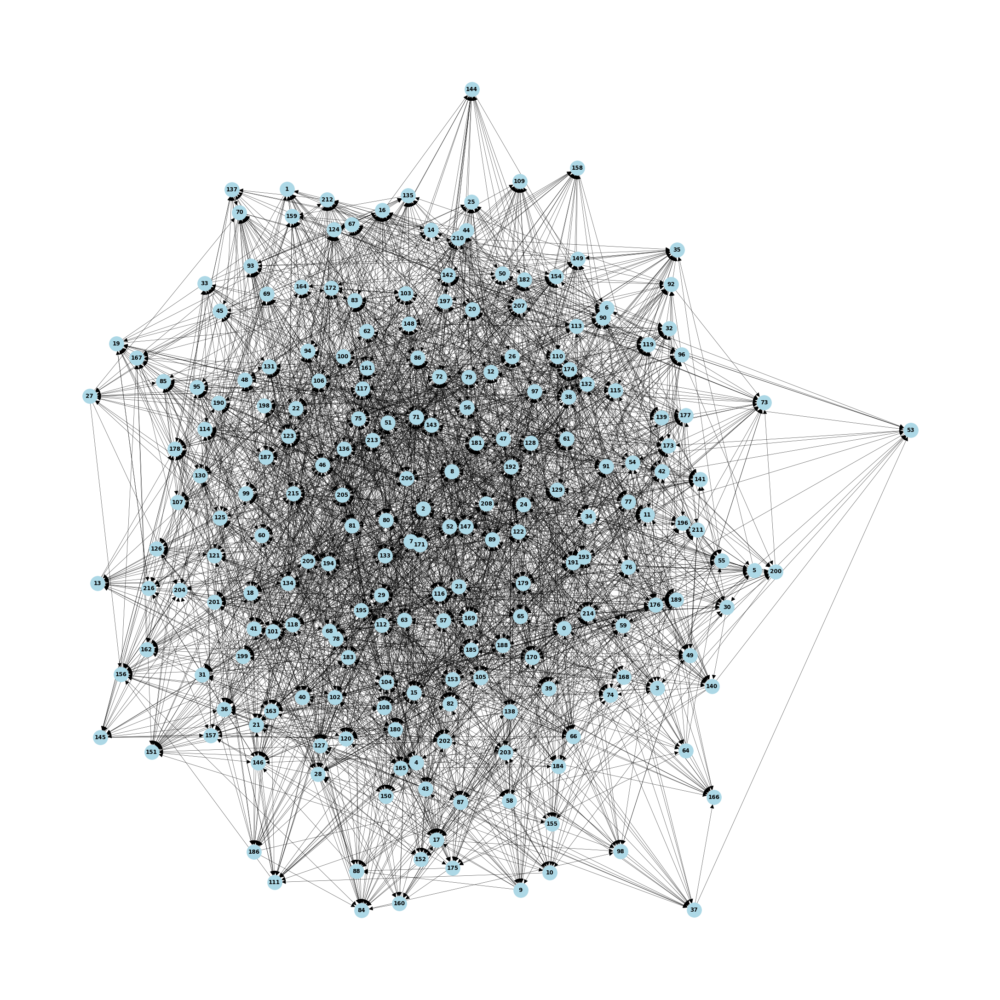

In [16]:
pos_erd = nx.spring_layout(ErdG, seed=seed, k=0.6, iterations=50)  # Seed for reproducible layout
draw_graph(ErdG,pos_erd)

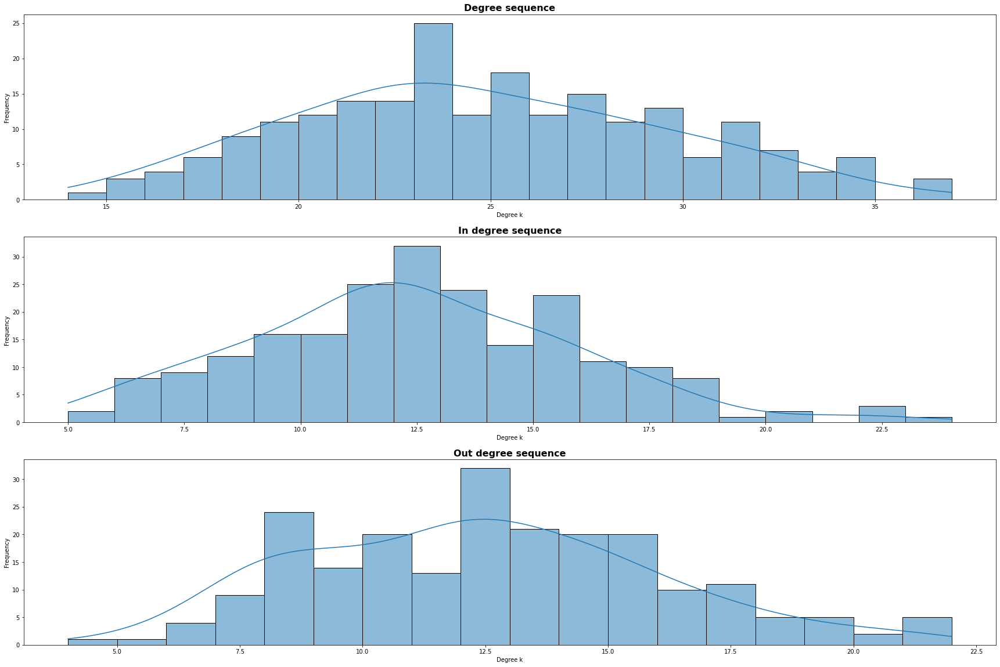

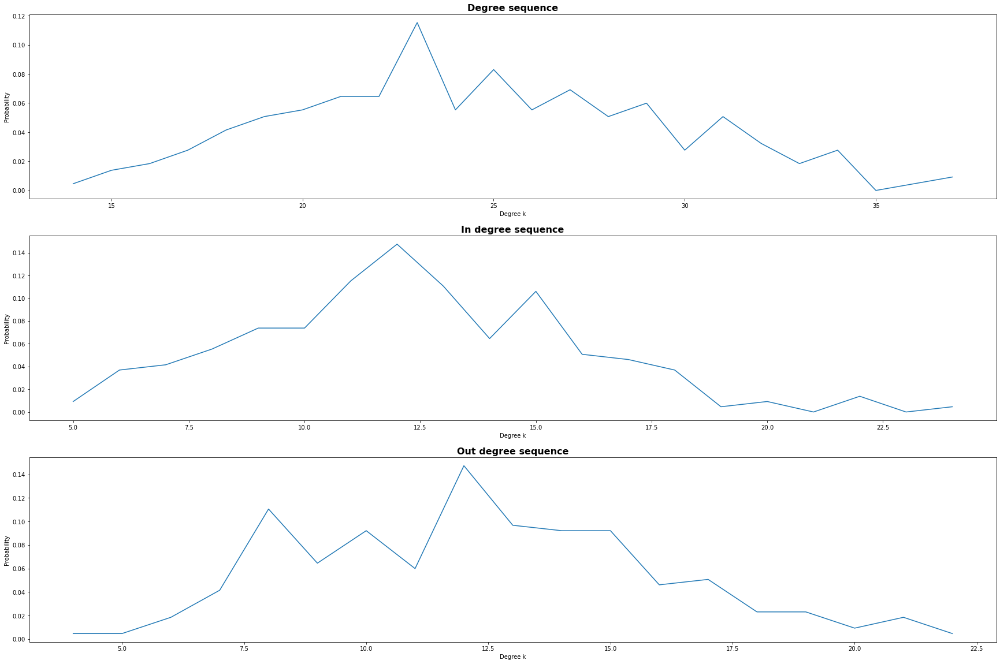

In [17]:
erd_degree_sequence = get_degrees_sequences(ErdG,True)
plot_degree_sequence(erd_degree_sequence,True)
plot_degree_probability(erd_degree_sequence,True)

### Distances between pairs of nodes are short (small-world property): good!
### The average clustering coefficient is much lower than on real networks of the  same size and average degree: bad!

In [18]:
check_small_wordl(G,ErdG)

Average shortest path length Original network:  2.73
Average shortest path length Random network:  2.42
Small-wordl
Average Clustering Original Network:  0.32
Average Clustering Random network: 0.06


### The nodes have approximately the same degree, there are no hubs: bad! 

In [19]:
print_degree_statistics(ErdG,True)

Mean degree: 24.62672811059908
Median degree: 24
Max degree: 37
Variance: 23.688726745178357
Standard deviation: 4.867106609185622

Highest degree node label: 16
Maximum degree 37


## Heterogeneity parameter

In [20]:
print_heterogeneity_parameter(erd_degree_sequence['In degree sequence'])

Heterogeneity parameter 1.08


## Betweenness of edges

In [21]:
betweenness_edges = nx.centrality.edge_betweenness(ErdG)
highest_betweenness_edge = max(ErdG.edges, key=betweenness_edges.get) #edge id with highest betweenness
value_highest_betweenness_edge = betweenness_edges[highest_betweenness_edge] #value of highest edg betweenness
betweenness_edges_sequence = list(betweenness_edges.values())
cprint('Edge with highest betweenness:', 'blue', end=' ') 
cprint(highest_betweenness_edge, 'green')
cprint('Value of highest betweenness edge:', 'blue', end=' ') 
cprint(round(value_highest_betweenness_edge,2), 'green')
cprint('Mean betweenness of edges:', 'blue', end=' ') 
cprint(round(statistics.mean(betweenness_edges_sequence),4), 'green')
cprint('Median betweenness of edges:', 'blue', end=' ') 
cprint(round(statistics.median(betweenness_edges_sequence),4), 'green')

Edge with highest betweenness: (53, 192)
Value of highest betweenness edge: 0.0
Mean betweenness of edges: 0.0009
Median betweenness of edges: 0.0009


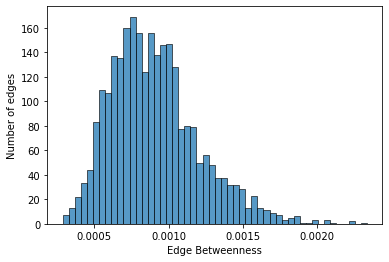

In [22]:
sns.histplot(data=betweenness_edges_sequence, bins=50)
plt.ylabel("Number of edges")
plt.xlabel("Edge Betweenness")
plt.show()

## Assortativity

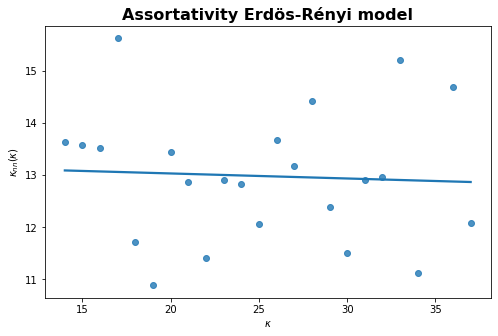

In [23]:
avg_degree_connectivity = nx.average_degree_connectivity(ErdG)

plt.figure(figsize=(8,5))

sns.regplot(x=list(avg_degree_connectivity.keys()), y=list(avg_degree_connectivity.values()), ci=None)
plt.title('Assortativity Erdös-Rényi model',fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.xlabel("$\kappa$")
plt.ylabel("$\kappa_{nn}(\kappa)$")

plt.show()

## The Watts-Strogatz model (Small World)

In [71]:
original_mean_degree = statistics.mean(get_degrees_sequences(G,True)['Degree sequence'])
#Arguments: number of nodes, median degree, probility of rewiring
Watts_Strogatz_G = nx.watts_strogatz_graph(G.number_of_nodes(), int(original_mean_degree), 0.1) 
nx.info(Watts_Strogatz_G)

'Graph with 217 nodes and 2604 edges'

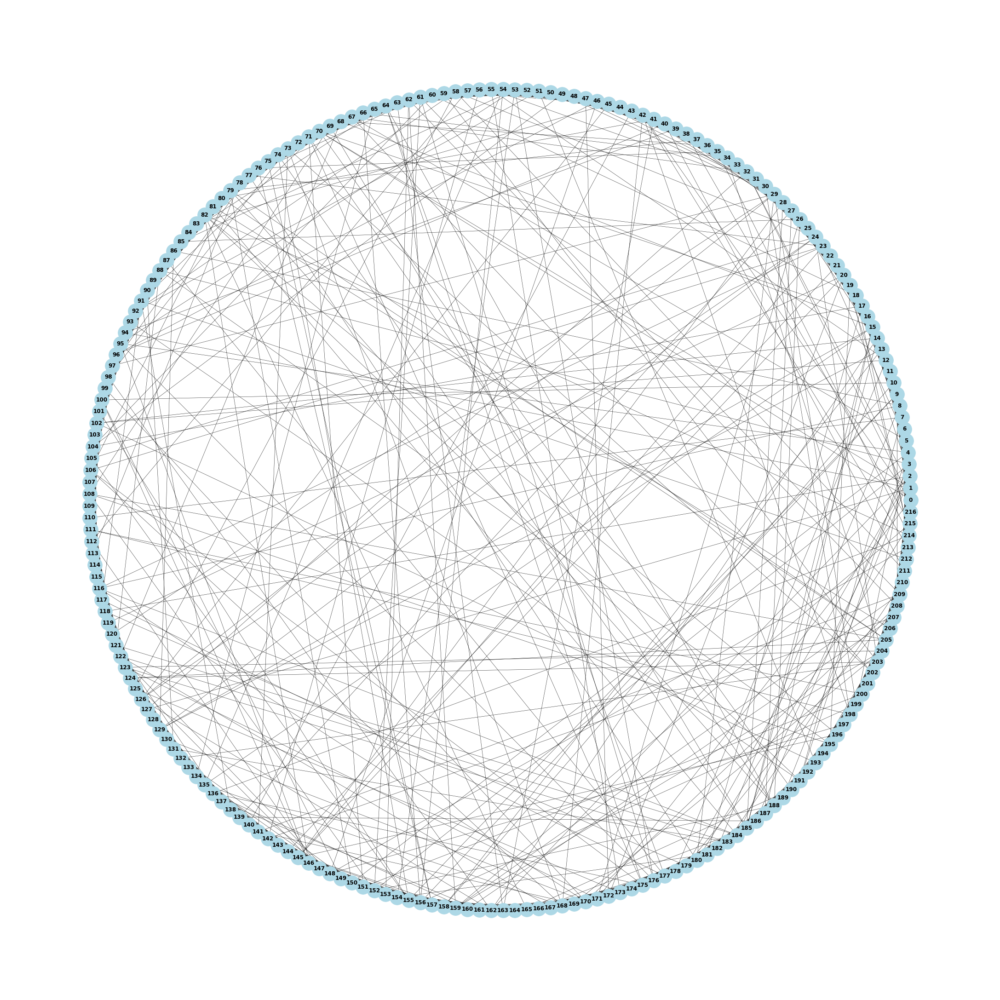

In [72]:
pos_watt = nx.circular_layout(Watts_Strogatz_G)  # Seed for reproducible layout
draw_graph(Watts_Strogatz_G,pos_watt)

#### There is a range of values of the rewiring probability p for which distances between pairs of nodes are short (small-world property) and the average clustering coefficient is high.

In [73]:
check_small_wordl(G,Watts_Strogatz_G)

Average shortest path length Original network:  2.73
Average shortest path length Random network:  2.33
Small-wordl
Average Clustering Original Network:  0.32
Average Clustering Random network: 0.54


In [74]:
probability = []
average_clustering_sequences= []
average_path_length_sequences= []
best_probability = []
best_probability_value = 10


for log_exp in np.arange(-40, 1, 1): #incrementation scheme for logarithmic exponents
    p = np.power(10, log_exp/10.0)
    wtg= nx.watts_strogatz_graph(G.number_of_nodes(), int(original_mean_degree), p)
    avg_shortest_path = nx.average_shortest_path_length(wtg)
    average_path_length_sequences.append(avg_shortest_path)
    avg_clustering = nx.average_clustering(wtg)
    average_clustering_sequences.append(avg_clustering)
    probability.append(p)
    if(math.isclose(math.log(wtg.number_of_nodes(),10),avg_shortest_path,abs_tol=0.08)):
        best_probability.append(round(p,4))
        if (avg_shortest_path - avg_clustering < best_probability_value):
            best_probability_value = p

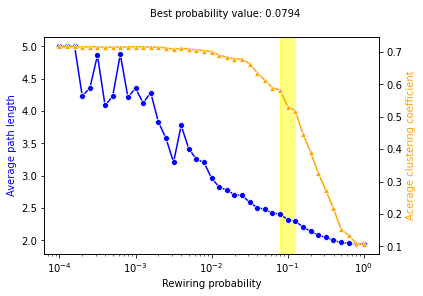

In [75]:
fig, ax1 = plt.subplots() # initializes figure and plots

ax2 = ax1.twinx() # applies twinx to ax2, which is the second y axis. 

sns.lineplot(x = probability, y = average_path_length_sequences, marker = 'o', color = 'blue', ax = ax1) # plots the first set of data, and sets it to ax1. 
sns.lineplot(x = probability, y = average_clustering_sequences, marker = '^', color = 'orange', ax = ax2) # plots the second set, and sets to ax2. 

# these lines add the annotations for the plot. 
ax1.set_xlabel('Rewiring probability')
ax1.set_ylabel('Average path length', color='blue')
ax2.set_ylabel('Acerage clustering coefficient', color='orange')
ax1.set_xscale('log')
ax2.set_xscale('log')


ax1.axvspan(0, best_probability[0], color='white', alpha=0.2)
ax1.axvspan(best_probability[0], best_probability[len(best_probability)-1], color='yellow', alpha=0.5)
ax1.axvspan(best_probability[len(best_probability)-1], 1, color='white', alpha=0.2)

#fig.legend('Best probability value: ' + str(round(best_probability_value,4)))
fig.legend(handles=[Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0, label=('Best probability value: ' + str(round(best_probability_value,4))))],loc=9, ncol=2,fontsize=10,frameon=False)
plt.show()

### The nodes have approximately the same degree, there are no hubs: bad!

In [79]:
best_p= statistics.mean(best_probability)
Best_Watts_Strogatz_G = nx.watts_strogatz_graph(G.number_of_nodes(), int(original_mean_degree), best_p) 
watt_degree_sequence = get_degrees_sequences(Best_Watts_Strogatz_G,False)

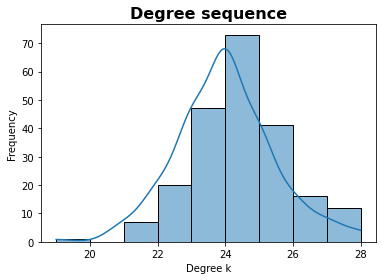

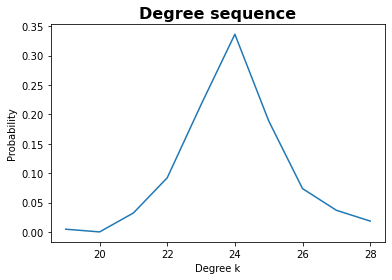

In [80]:
plot_degree_sequence(watt_degree_sequence, False)
plot_degree_probability(watt_degree_sequence, False)

## Heterogeneity parameter

In [78]:
print_heterogeneity_parameter(watt_degree_sequence['Degree sequence'])

Heterogeneity parameter 1.0


## Configuration Model Network

In [32]:
"""
• Degree-preserving randomization: generate randomized versions of a given 
network with the same degree sequence, using the configuration model 
• Why: useful to see whether a specific property of the original network is 
determined by its degree distribution alone
• If the property is maintained in the randomized configurations, then the 
degree distribution is the main driver
• If the property is lost in the randomized configurations, other factors must 
be responsible for it
"""

in_degree_sequence_conf_model = [G.in_degree(n) for n in G.nodes]
out_degree_sequence_conf_model =[G.out_degree(n) for n in G.nodes]
G_conf_model = nx.directed_configuration_model(in_degree_sequence_conf_model, out_degree_sequence_conf_model, create_using=nx.DiGraph) 
G_conf_model.remove_edges_from(nx.selfloop_edges(G_conf_model)) #to remove self-loops 
nx.info(G_conf_model)

'DiGraph with 217 nodes and 2560 edges'

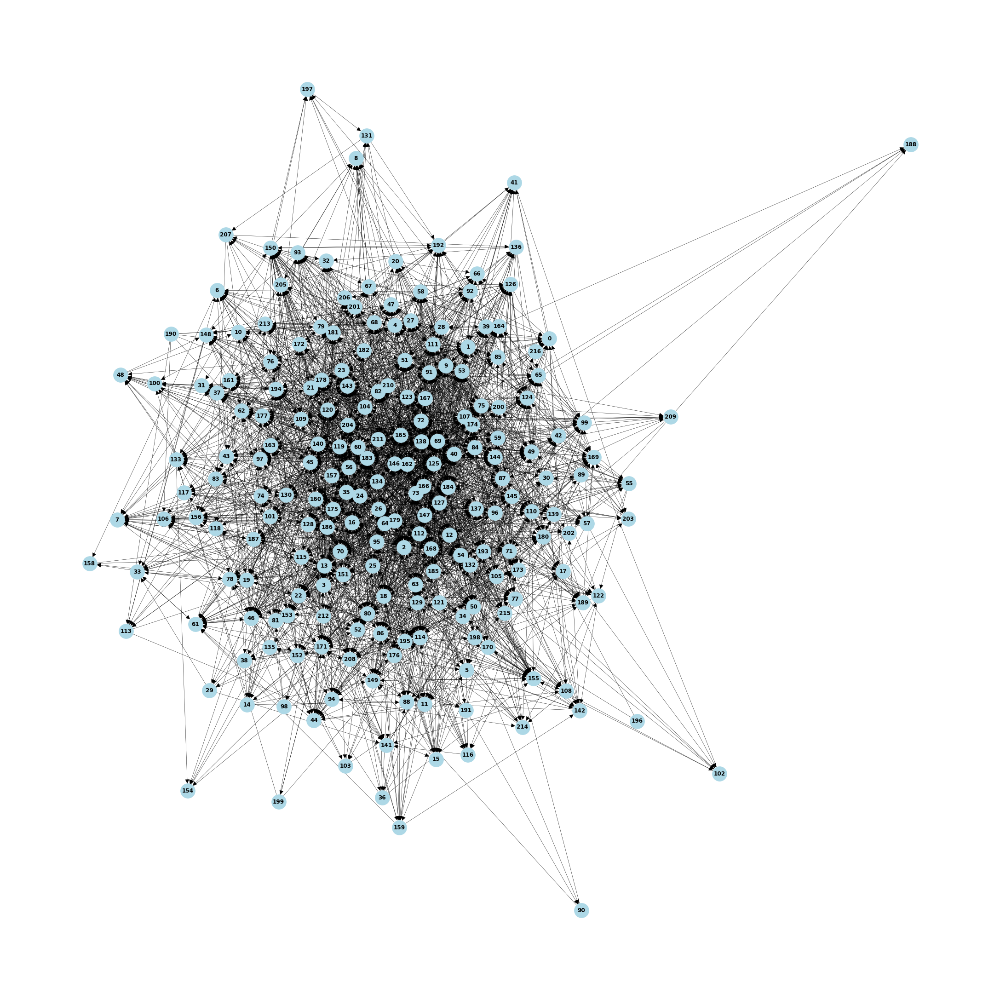

In [33]:
pos_conf = nx.spring_layout(G_conf_model, seed=seed, k=0.6, iterations=100)  # Seed for reproducible layout
draw_graph(G_conf_model,pos_conf)

### Degree evaluation

In [34]:
print_degree_statistics(G_conf_model,True)

Mean degree: 23.59447004608295
Median degree: 22
Max degree: 74
Variance: 106.8625618706264
Standard deviation: 10.337434975400155

Highest degree node label: 69
Maximum degree 74


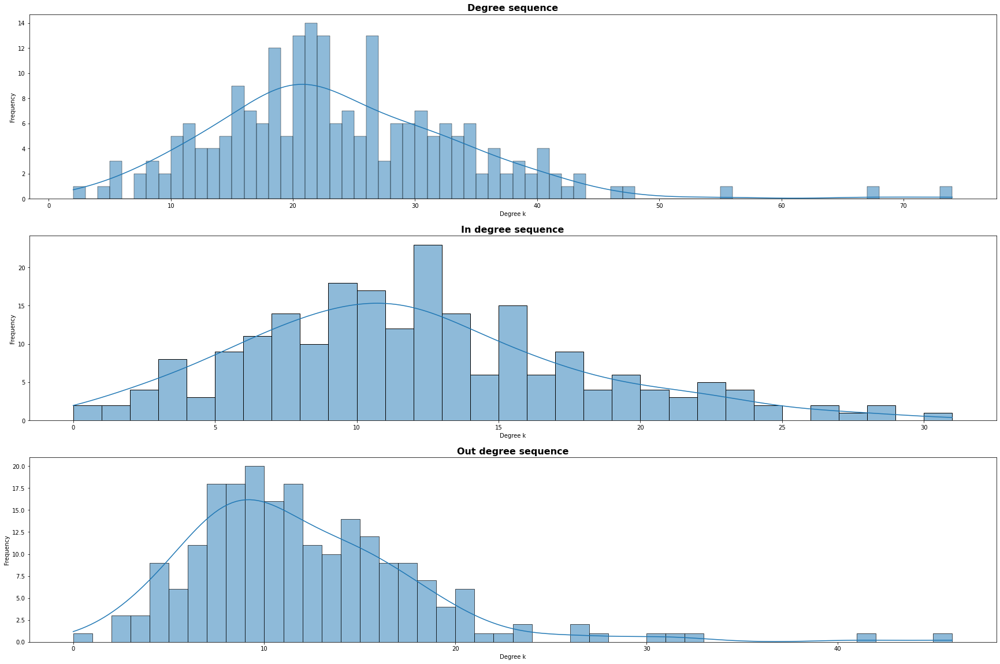

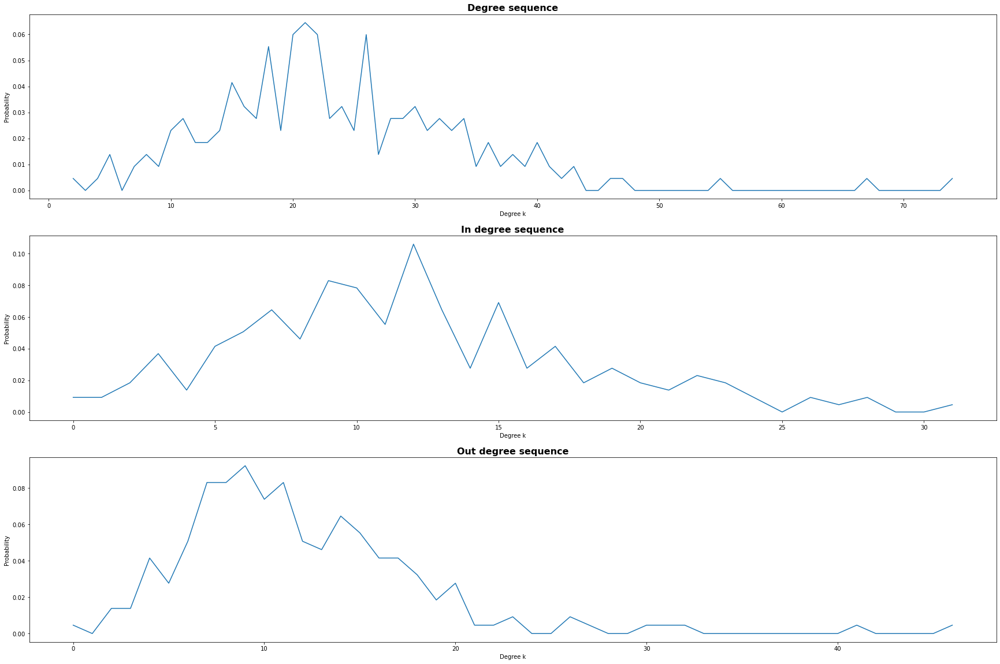

In [35]:
conf_degree_sequence = get_degrees_sequences(G_conf_model,True)
plot_degree_sequence(conf_degree_sequence,True)
plot_degree_probability(conf_degree_sequence,True)

## Heterogeneity parameter

In [36]:
print_heterogeneity_parameter(conf_degree_sequence['In degree sequence'])

Heterogeneity parameter 1.25


### Small-wordl

In [37]:
check_small_wordl(G,G_conf_model)

Average shortest path length Original network:  2.73
Average shortest path length Random network:  2.44
Small-wordl
Average Clustering Original Network:  0.32
Average Clustering Random network: 0.08


### Assortativity

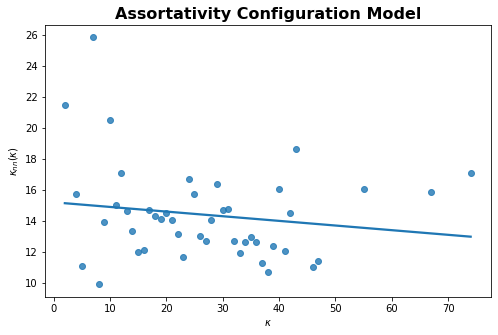

In [38]:
avg_degree_connectivity = nx.average_degree_connectivity(G_conf_model)

plt.figure(figsize=(8,5))

sns.regplot(x=list(avg_degree_connectivity.keys()), y=list(avg_degree_connectivity.values()), ci=None)
plt.title('Assortativity Configuration Model',fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.xlabel("$\kappa$")
plt.ylabel("$\kappa_{nn}(\kappa)$")

plt.show()

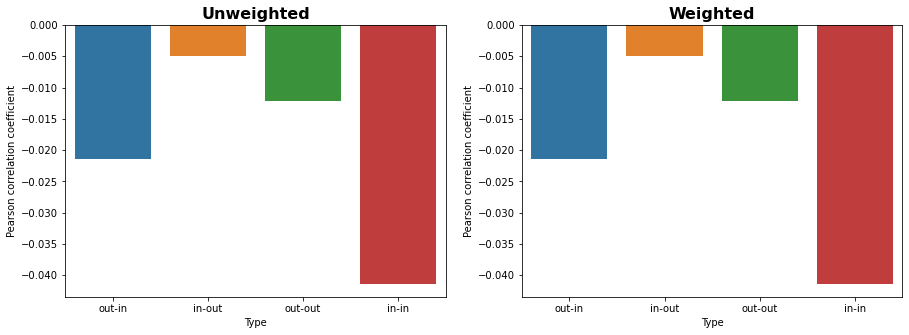

In [39]:
assortativity_data_1 = pd.DataFrame({'Type':'out-in', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='out', y='in')]})
assortativity_data_2 = pd.DataFrame({'Type':'in-out', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='in', y='out')]})
assortativity_data_3 = pd.DataFrame({'Type':'out-out', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='out', y='out')]})
assortativity_data_4 = pd.DataFrame({'Type':'in-in', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='in', y='in')]})

assortativity_data = pd.concat([assortativity_data_1,assortativity_data_2,assortativity_data_3,assortativity_data_4])

w_assortativity_data_1 = pd.DataFrame({'Type':'out-in', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='out', y='in', weight='weight')]})
w_assortativity_data_2 = pd.DataFrame({'Type':'in-out', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='in', y='out', weight='weight')]})
w_assortativity_data_3 = pd.DataFrame({'Type':'out-out', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='out', y='out', weight='weight')]})
w_assortativity_data_4 = pd.DataFrame({'Type':'in-in', 'Pearson correlation coefficient' : [nx.degree_pearson_correlation_coefficient(G_conf_model, x='in', y='in', weight='weight')]})

w_assortativity_data = pd.concat([w_assortativity_data_1,w_assortativity_data_2,w_assortativity_data_3,w_assortativity_data_4])

#Creating figure area
fig_ass, axes = plt.subplots(nrows=1, ncols=2)

#plotting first graph
sns.barplot(
    data=assortativity_data,
    x='Type', y='Pearson correlation coefficient',
    ax=axes[0]
)
axes[0].set_title('Unweighted',fontdict= { 'fontsize': 16, 'fontweight':'bold'})

#plotting second graph
sns.barplot(
    data=w_assortativity_data,
    x='Type', y='Pearson correlation coefficient',
    ax=axes[1]
)
axes[1].set_title('Weighted',fontdict= { 'fontsize': 16, 'fontweight':'bold'})


fig_ass.figure.set_size_inches((15,5))


## Preferential Model Network

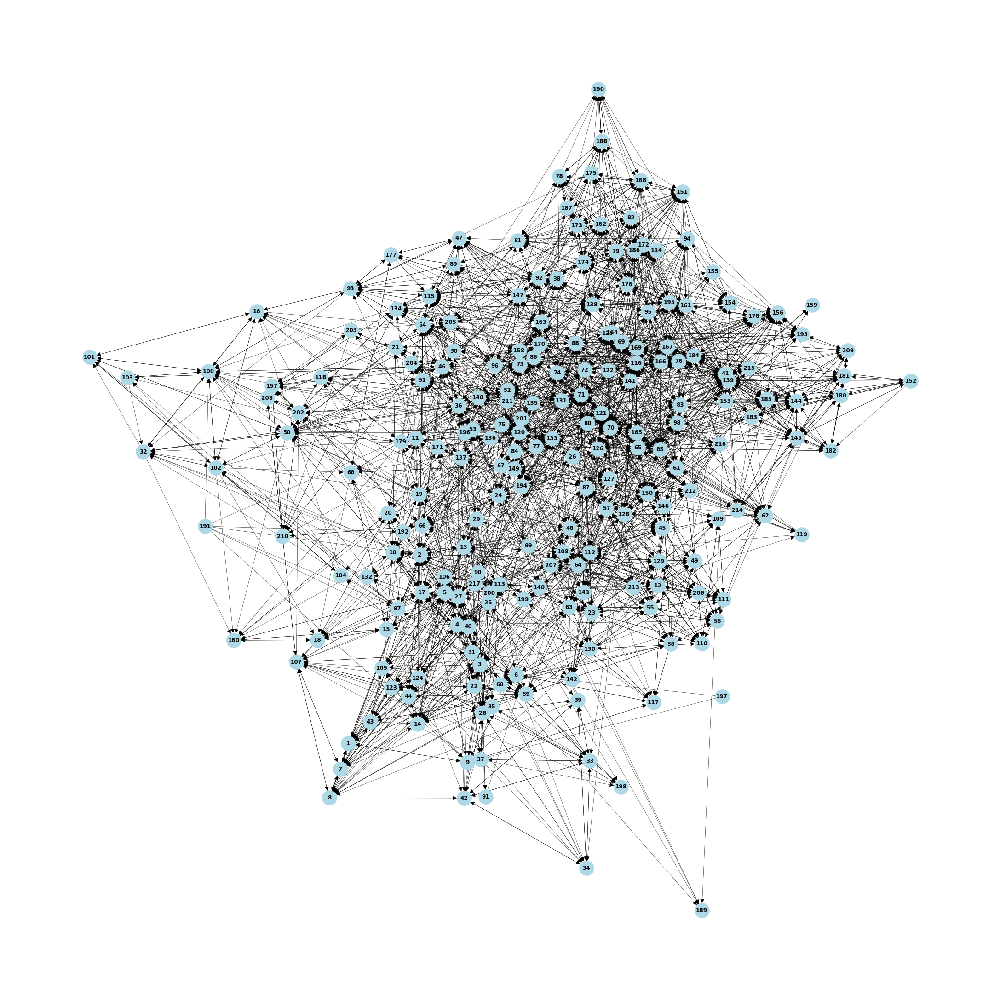

In [50]:
initial_graph = G.copy()
G_barabasi = nx.barabasi_albert_graph(initial_graph=G,n=217, m=20)

pos_bar = nx.spring_layout(G_barabasi, k=0.6, iterations=50)  # Seed for reproducible layout
draw_graph(G_barabasi,pos_bar)
# nx.draw(G_barabasi)
# nx.info(G_barabasi)

### Assortativity

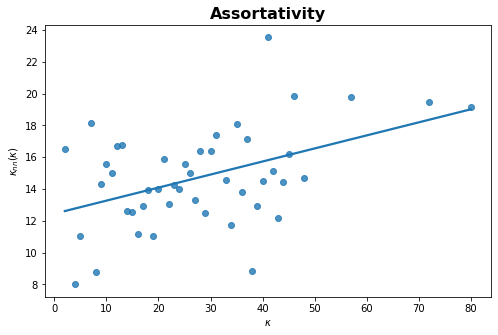

In [45]:
avg_degree_connectivity = nx.average_degree_connectivity(G_barabasi)

plt.figure(figsize=(8,5))

sns.regplot(x=list(avg_degree_connectivity.keys()), y=list(avg_degree_connectivity.values()), ci=None)
plt.title('Assortativity',fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.xlabel("$\kappa$")
plt.ylabel("$\kappa_{nn}(\kappa)$")

plt.show()

Calculating best minimal value for power law fit
xmin progress: 97%
Alpha:7.07
xmin:33.0


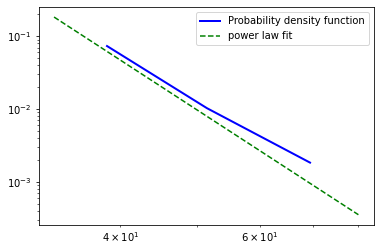

In [49]:
fit = powerlaw.Fit([G.degree(n) for n in G.nodes],fit_method="KS")
fig2 = fit.plot_pdf(color='b', linewidth=2)
fig3 = fit.power_law.plot_pdf(color='g', linestyle='--', ax=fig2)
fig3.legend(["Probability density function","power law fit"])
print()
print("Alpha:" + str(round(fit.power_law.alpha,2)))
print("xmin:" + str(round(fit.power_law.xmin,2)))